Anime Face Generation

In [1]:
# Install necessary libraries
!pip install opendatasets --upgrade --quiet

In [2]:
# Import libraries
import opendatasets as od
import os
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
import torch.nn as nn
from torchvision.utils import save_image
from tqdm.notebook import tqdm
import torch.nn.functional as F
from IPython.display import Image
import cv2
import os

import warnings
warnings.filterwarnings("ignore")

To run this, you must set your Kaggle API credentials.
You can get your `kaggle.json` from your Kaggle profile under "Account" section.

In [3]:
# Download dataset from Kaggle
dataset_url = 'https://www.kaggle.com/splcher/animefacedataset'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: anjaligedam
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset


100%|██████████| 395M/395M [00:04<00:00, 92.4MB/s]


In [4]:
# Set data directory
DATA_DIR = './animefacedataset'
print(os.listdir(DATA_DIR))

['images']


In [5]:
# Check files in the images folder
print(os.listdir(DATA_DIR+'/images')[:10])

['33667_2011.jpg', '42299_2013.jpg', '38963_2012.jpg', '50194_2015.jpg', '9430_2004.jpg', '47586_2014.jpg', '23613_2008.jpg', '60352_2018.jpg', '55997_2017.jpg', '15133_2006.jpg']


In [6]:
# Define image size, batch size, and normalization statistics
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [7]:
# Create training dataset and dataloader
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [8]:
# Define functions for denormalization and displaying images
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

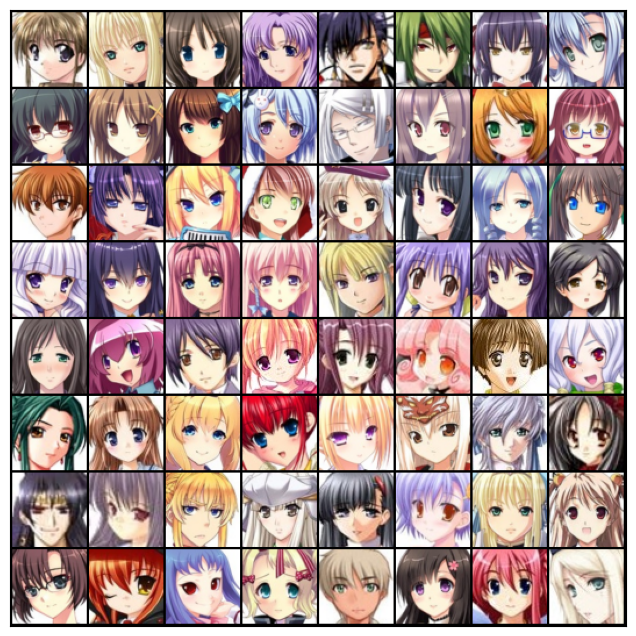

In [9]:
show_batch(train_dl)

In [10]:
# Define functions to handle device placement
def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        return len(self.dl)

In [11]:
# Get the default device and move data to it
device = get_default_device()
device

device(type='cuda')

In [12]:
train_dl = DeviceDataLoader(train_dl, device)

In [13]:
# Define the discriminator model
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [14]:
discriminator = to_device(discriminator, device)

In [15]:
# Define latent size for generator
latent_size = 128

In [16]:
# Define the generator model
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


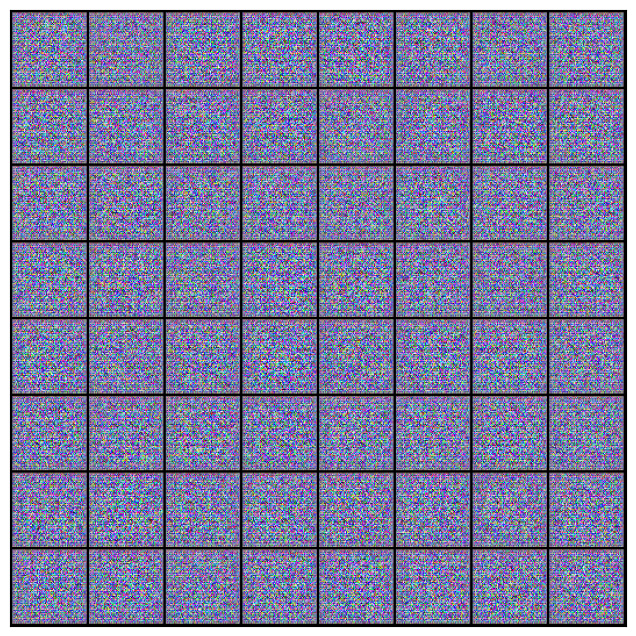

In [17]:
# Generate random latent tensors
xb = torch.randn(batch_size, latent_size, 1, 1)
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [18]:
# Move models to device
generator = to_device(generator, device)

In [19]:
# Define functions for training discriminator
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [20]:
# Define functions for training generator
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [21]:
# Define the directory to save generated samples
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [22]:
# Define a function to save generated samples
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [23]:
# Generate fixed latent tensors for sampling
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


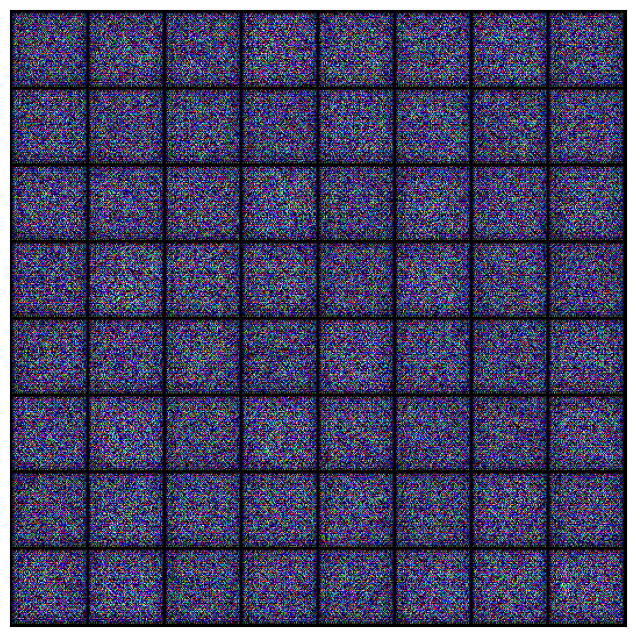

In [24]:
# Save initial generated samples
save_samples(0, fixed_latent)

In [25]:
# Define the fit function to train the GAN
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [26]:
# Set hyperparameters
lr = 0.001
epochs = 100

In [27]:
history = fit(epochs, lr)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 4.3052, loss_d: 0.8989, real_score: 0.7344, fake_score: 0.3785
Saving generated-images-0001.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 7.5881, loss_d: 0.8682, real_score: 0.8322, fake_score: 0.4425
Saving generated-images-0002.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 5.2097, loss_d: 0.5663, real_score: 0.6512, fake_score: 0.0218
Saving generated-images-0003.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 5.0583, loss_d: 0.3499, real_score: 0.8650, fake_score: 0.1489
Saving generated-images-0004.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 7.3449, loss_d: 0.6946, real_score: 0.9983, fake_score: 0.4225
Saving generated-images-0005.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 8.2260, loss_d: 0.7569, real_score: 0.9619, fake_score: 0.4598
Saving generated-images-0006.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 11.6884, loss_d: 0.9430, real_score: 0.9823, fake_score: 0.5297
Saving generated-images-0007.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 4.1506, loss_d: 0.2096, real_score: 0.9417, fake_score: 0.1049
Saving generated-images-0008.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 1.9028, loss_d: 1.0975, real_score: 0.4846, fake_score: 0.0065
Saving generated-images-0009.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 5.9026, loss_d: 0.3554, real_score: 0.9074, fake_score: 0.1765
Saving generated-images-0010.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 3.6612, loss_d: 0.2940, real_score: 0.8614, fake_score: 0.0596
Saving generated-images-0011.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 5.2328, loss_d: 0.2502, real_score: 0.8314, fake_score: 0.0130
Saving generated-images-0012.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 5.2585, loss_d: 0.0952, real_score: 0.9496, fake_score: 0.0344
Saving generated-images-0013.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 9.0844, loss_d: 0.6237, real_score: 0.9959, fake_score: 0.3777
Saving generated-images-0014.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 5.2120, loss_d: 0.1012, real_score: 0.9453, fake_score: 0.0341
Saving generated-images-0015.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 6.2620, loss_d: 0.0665, real_score: 0.9777, fake_score: 0.0388
Saving generated-images-0016.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 5.5406, loss_d: 0.1176, real_score: 0.9763, fake_score: 0.0759
Saving generated-images-0017.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 6.5619, loss_d: 1.1518, real_score: 0.5438, fake_score: 0.0011
Saving generated-images-0018.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 4.9616, loss_d: 0.0444, real_score: 0.9734, fake_score: 0.0152
Saving generated-images-0019.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 5.2508, loss_d: 0.2098, real_score: 0.9641, fake_score: 0.1307
Saving generated-images-0020.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 6.1131, loss_d: 0.9616, real_score: 0.9862, fake_score: 0.4128
Saving generated-images-0021.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 10.9580, loss_d: 0.3827, real_score: 0.9939, fake_score: 0.2687
Saving generated-images-0022.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 6.3838, loss_d: 0.2594, real_score: 0.9518, fake_score: 0.1412
Saving generated-images-0023.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 7.4221, loss_d: 0.1276, real_score: 0.9889, fake_score: 0.0932
Saving generated-images-0024.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 5.2454, loss_d: 0.0583, real_score: 0.9756, fake_score: 0.0310
Saving generated-images-0025.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 4.6644, loss_d: 0.0475, real_score: 0.9710, fake_score: 0.0167
Saving generated-images-0026.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 5.7500, loss_d: 0.1941, real_score: 0.8569, fake_score: 0.0047
Saving generated-images-0027.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 0.5492, loss_d: 9.0625, real_score: 0.0005, fake_score: 0.0000
Saving generated-images-0028.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 4.5721, loss_d: 0.0423, real_score: 0.9828, fake_score: 0.0209
Saving generated-images-0029.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 5.5310, loss_d: 0.0830, real_score: 0.9616, fake_score: 0.0381
Saving generated-images-0030.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 5.7113, loss_d: 0.0892, real_score: 0.9650, fake_score: 0.0436
Saving generated-images-0031.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 5.8558, loss_d: 0.0721, real_score: 0.9812, fake_score: 0.0405
Saving generated-images-0032.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 5.8110, loss_d: 0.1075, real_score: 0.9921, fake_score: 0.0826
Saving generated-images-0033.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 6.1800, loss_d: 0.0907, real_score: 0.9827, fake_score: 0.0572
Saving generated-images-0034.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 6.9076, loss_d: 0.0809, real_score: 0.9453, fake_score: 0.0106
Saving generated-images-0035.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 5.6318, loss_d: 0.0430, real_score: 0.9698, fake_score: 0.0106
Saving generated-images-0036.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 6.2421, loss_d: 0.5056, real_score: 0.9703, fake_score: 0.2867
Saving generated-images-0037.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 6.1739, loss_d: 0.0557, real_score: 0.9903, fake_score: 0.0374
Saving generated-images-0038.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 6.9487, loss_d: 0.1791, real_score: 0.9728, fake_score: 0.1063
Saving generated-images-0039.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 7.1421, loss_d: 0.1491, real_score: 0.8923, fake_score: 0.0072
Saving generated-images-0040.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 5.7832, loss_d: 0.0344, real_score: 0.9847, fake_score: 0.0164
Saving generated-images-0041.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 7.6058, loss_d: 0.2759, real_score: 0.9450, fake_score: 0.1237
Saving generated-images-0042.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 6.8173, loss_d: 0.5080, real_score: 0.9917, fake_score: 0.2879
Saving generated-images-0043.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 8.4259, loss_d: 0.0595, real_score: 0.9943, fake_score: 0.0423
Saving generated-images-0044.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 1.8403, loss_d: 5.9400, real_score: 0.0458, fake_score: 0.0000
Saving generated-images-0045.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 6.3917, loss_d: 0.0194, real_score: 0.9899, fake_score: 0.0090
Saving generated-images-0046.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 5.3154, loss_d: 0.3622, real_score: 0.9134, fake_score: 0.1669
Saving generated-images-0047.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 4.1717, loss_d: 0.0606, real_score: 0.9571, fake_score: 0.0123
Saving generated-images-0048.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 3.4446, loss_d: 0.1290, real_score: 0.8994, fake_score: 0.0057
Saving generated-images-0049.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 5.8442, loss_d: 0.0527, real_score: 0.9852, fake_score: 0.0302
Saving generated-images-0050.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 2.6124, loss_d: 2.5402, real_score: 0.2516, fake_score: 0.0000
Saving generated-images-0051.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 5.8984, loss_d: 0.0328, real_score: 0.9851, fake_score: 0.0165
Saving generated-images-0052.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 6.9800, loss_d: 0.0066, real_score: 0.9959, fake_score: 0.0025
Saving generated-images-0053.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 4.4026, loss_d: 0.0813, real_score: 0.9573, fake_score: 0.0235
Saving generated-images-0054.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 6.9247, loss_d: 0.1106, real_score: 0.9881, fake_score: 0.0788
Saving generated-images-0055.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 8.2528, loss_d: 0.2251, real_score: 0.9948, fake_score: 0.1552
Saving generated-images-0056.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 6.9418, loss_d: 0.0122, real_score: 0.9919, fake_score: 0.0040
Saving generated-images-0057.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 6.9790, loss_d: 0.0905, real_score: 0.9476, fake_score: 0.0134
Saving generated-images-0058.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 6.1105, loss_d: 0.0387, real_score: 0.9819, fake_score: 0.0183
Saving generated-images-0059.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 0.0048, loss_d: 2.9930, real_score: 0.1371, fake_score: 0.0000
Saving generated-images-0060.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 6.6930, loss_d: 0.0298, real_score: 0.9953, fake_score: 0.0236
Saving generated-images-0061.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 6.0191, loss_d: 0.0385, real_score: 0.9874, fake_score: 0.0238
Saving generated-images-0062.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 6.9215, loss_d: 0.0895, real_score: 0.9439, fake_score: 0.0197
Saving generated-images-0063.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 7.0645, loss_d: 0.0174, real_score: 0.9930, fake_score: 0.0097
Saving generated-images-0064.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 6.6770, loss_d: 0.0084, real_score: 0.9987, fake_score: 0.0070
Saving generated-images-0065.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 6.6384, loss_d: 0.0372, real_score: 0.9767, fake_score: 0.0120
Saving generated-images-0066.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 6.8371, loss_d: 0.0217, real_score: 0.9895, fake_score: 0.0101
Saving generated-images-0067.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 5.9643, loss_d: 0.2013, real_score: 0.9818, fake_score: 0.1174
Saving generated-images-0068.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 6.0885, loss_d: 0.0727, real_score: 0.9706, fake_score: 0.0368
Saving generated-images-0069.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 6.1841, loss_d: 0.0147, real_score: 0.9949, fake_score: 0.0090
Saving generated-images-0070.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 12.9937, loss_d: 0.1328, real_score: 0.9992, fake_score: 0.0960
Saving generated-images-0071.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 7.5398, loss_d: 0.0260, real_score: 0.9804, fake_score: 0.0053
Saving generated-images-0072.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 7.6936, loss_d: 0.0865, real_score: 0.9937, fake_score: 0.0542
Saving generated-images-0073.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 6.1268, loss_d: 0.0410, real_score: 0.9937, fake_score: 0.0306
Saving generated-images-0074.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 7.4745, loss_d: 0.1185, real_score: 0.9898, fake_score: 0.0798
Saving generated-images-0075.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 6.0653, loss_d: 0.0739, real_score: 0.9730, fake_score: 0.0403
Saving generated-images-0076.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 6.4332, loss_d: 0.0420, real_score: 0.9725, fake_score: 0.0071
Saving generated-images-0077.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 7.1041, loss_d: 0.0548, real_score: 0.9915, fake_score: 0.0362
Saving generated-images-0078.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 6.7851, loss_d: 0.0139, real_score: 0.9963, fake_score: 0.0097
Saving generated-images-0079.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 7.2141, loss_d: 0.0772, real_score: 0.9951, fake_score: 0.0572
Saving generated-images-0080.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 5.1801, loss_d: 0.0876, real_score: 0.9690, fake_score: 0.0431
Saving generated-images-0081.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 5.1156, loss_d: 0.0354, real_score: 0.9759, fake_score: 0.0078
Saving generated-images-0082.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 6.2868, loss_d: 0.0657, real_score: 0.9558, fake_score: 0.0088
Saving generated-images-0083.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 6.6499, loss_d: 0.0170, real_score: 0.9954, fake_score: 0.0118
Saving generated-images-0084.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 7.1941, loss_d: 0.0615, real_score: 0.9912, fake_score: 0.0459
Saving generated-images-0085.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 5.2667, loss_d: 0.1940, real_score: 0.9373, fake_score: 0.0817
Saving generated-images-0086.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 7.4056, loss_d: 0.0162, real_score: 0.9890, fake_score: 0.0049
Saving generated-images-0087.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 6.5115, loss_d: 0.1062, real_score: 0.9475, fake_score: 0.0278
Saving generated-images-0088.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 6.6449, loss_d: 0.0338, real_score: 0.9875, fake_score: 0.0178
Saving generated-images-0089.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 6.5223, loss_d: 0.0217, real_score: 0.9893, fake_score: 0.0103
Saving generated-images-0090.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 8.2041, loss_d: 0.0092, real_score: 0.9938, fake_score: 0.0027
Saving generated-images-0091.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 5.8674, loss_d: 0.0530, real_score: 0.9695, fake_score: 0.0144
Saving generated-images-0092.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 6.5194, loss_d: 0.0189, real_score: 0.9923, fake_score: 0.0102
Saving generated-images-0093.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 7.2829, loss_d: 0.0174, real_score: 0.9939, fake_score: 0.0103
Saving generated-images-0094.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 9.1410, loss_d: 0.0116, real_score: 0.9928, fake_score: 0.0037
Saving generated-images-0095.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 6.2887, loss_d: 0.1303, real_score: 0.9559, fake_score: 0.0652
Saving generated-images-0096.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 6.5401, loss_d: 0.0258, real_score: 0.9792, fake_score: 0.0034
Saving generated-images-0097.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 4.2833, loss_d: 0.2028, real_score: 0.9147, fake_score: 0.0786
Saving generated-images-0098.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 6.1185, loss_d: 0.0508, real_score: 0.9681, fake_score: 0.0129
Saving generated-images-0099.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 6.9568, loss_d: 0.0469, real_score: 0.9981, fake_score: 0.0360
Saving generated-images-0100.png


In [28]:
losses_g, losses_d, real_scores, fake_scores = history

In [29]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

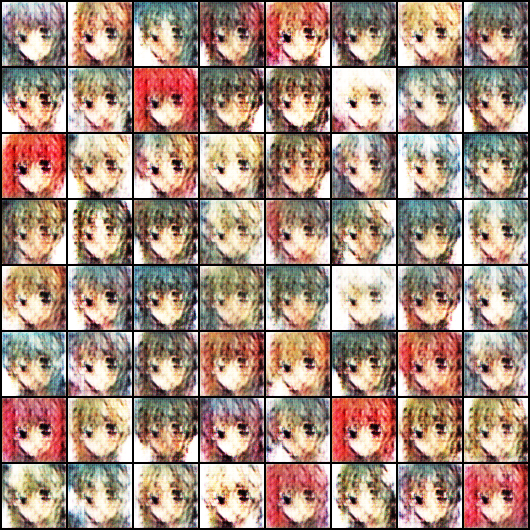

In [30]:
# Display sample generated images at different epochs
Image('./generated/generated-images-0001.png')

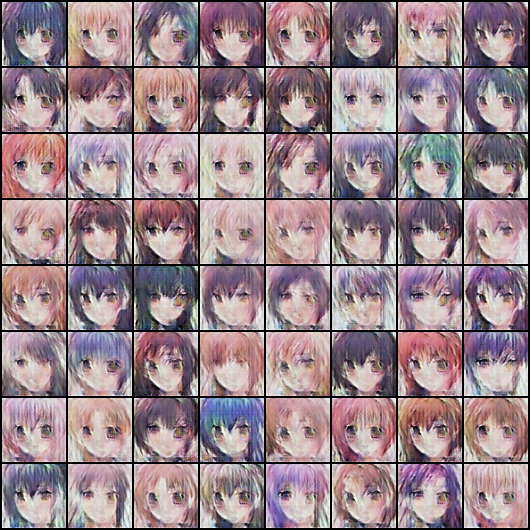

In [31]:
Image('./generated/generated-images-0005.png')

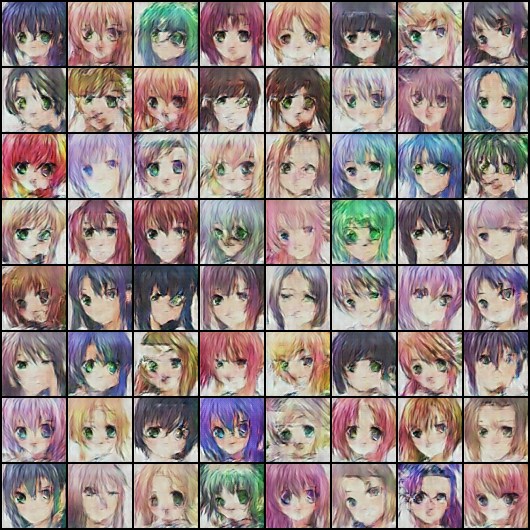

In [32]:
Image('./generated/generated-images-0010.png')

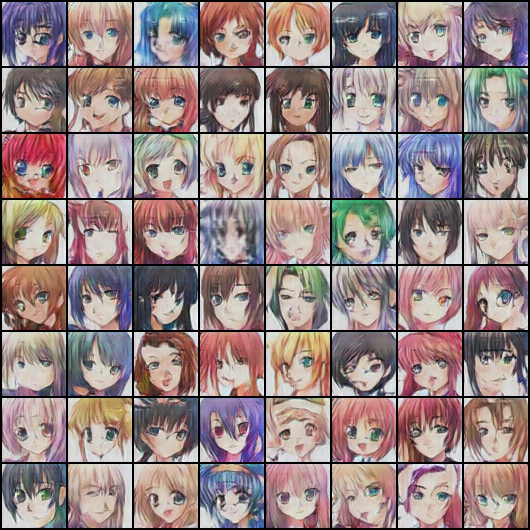

In [33]:
Image('./generated/generated-images-0020.png')

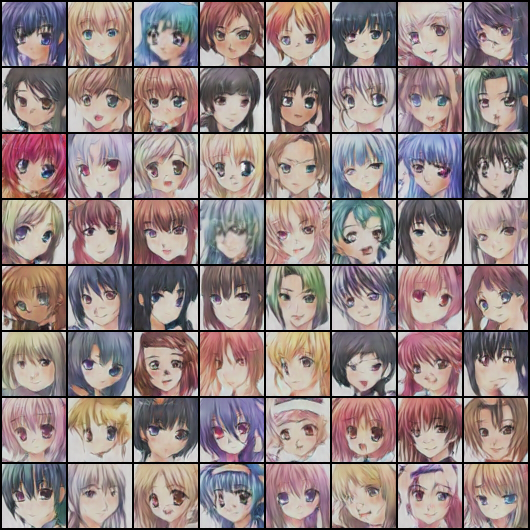

In [34]:
Image('./generated/generated-images-0025.png')

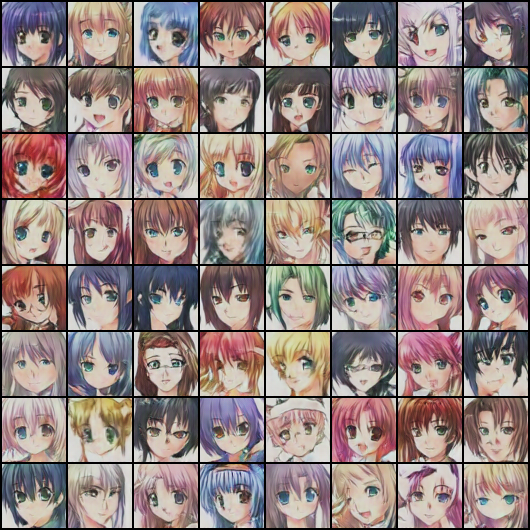

In [38]:
Image('./generated/generated-images-0050.png')

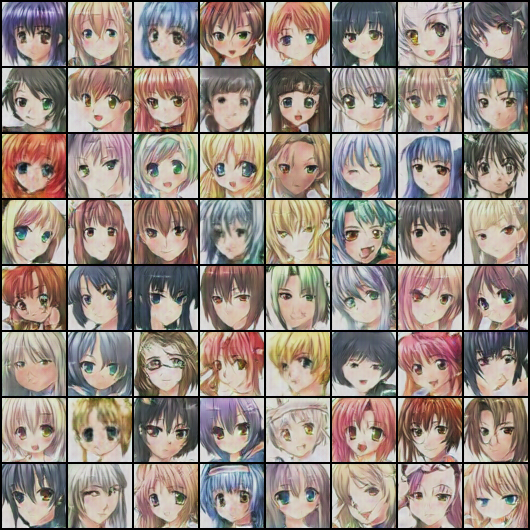

In [39]:
Image('./generated/generated-images-0075.png')

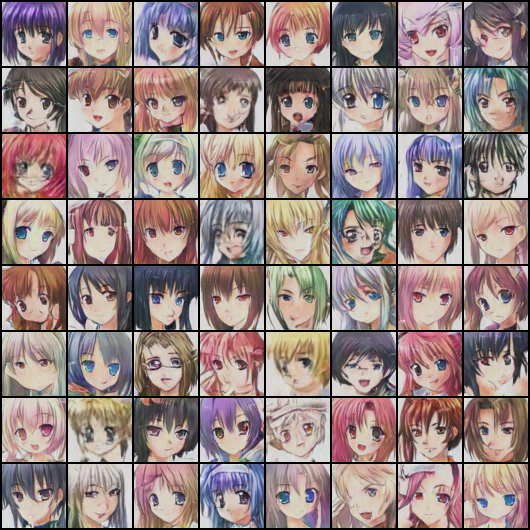

In [40]:
Image('./generated/generated-images-0100.png')

In [35]:
# Create a video from the generated images
vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

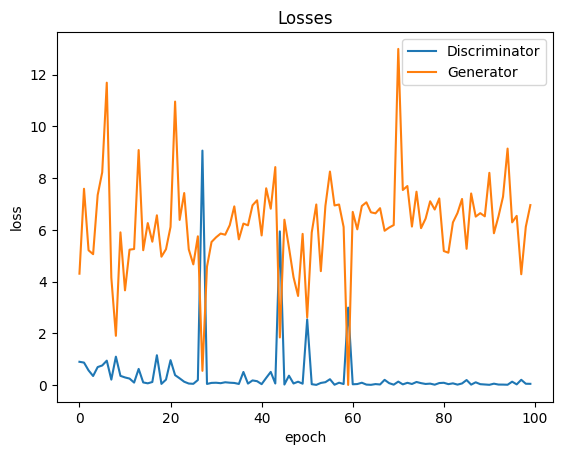

In [36]:
# Plot the losses
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

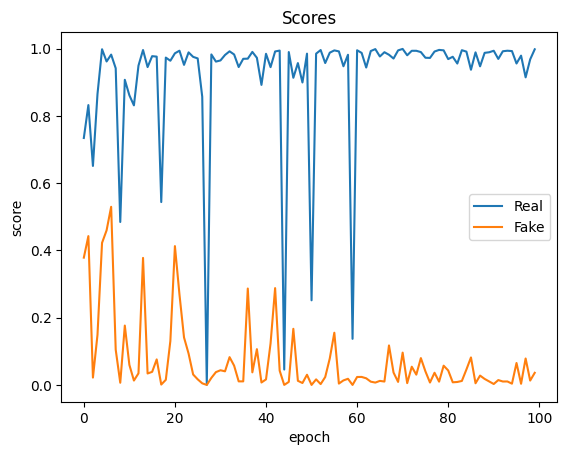

In [37]:
# Plot the scores
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');